# Visualizing Subgraphs Top Interactions from Tweets Data with NetworkX

In [1]:
from __future__ import print_function
import graphistry
import snap
from snap import TUNGraph
import pandas as pd
import matplotlib as mpl
from matplotlib import pyplot as plt
import seaborn as sns
import os
import numpy as np
import networkx as nx
from math import sqrt
import operator
import community
from random import shuffle
from collections import Counter
import sys

# Set Seaborn defaults
sns.set()
%matplotlib inline
pd.set_option("display.precision", 6)
mpl.rcParams['figure.dpi'] = 100
mpl.rcParams['savefig.dpi'] = 150
mpl.rcParams['figure.autolayout'] = True

# Global variables
data_dir = "../data"
pictures_path = os.path.join("../Pictures", "9.GraphViz")

In [20]:
# Utility functions
def get_relative_percentage(n,m):
    return n*100.0/m

def load_graph_from_backup(filename):
    FIn = snap.TFIn("../data/"+filename+".bin")
    graph = snap.TUNGraph.Load(FIn)
    return graph

def load_edges_df(hashtag):
    return pd.read_csv(os.path.join(data_dir,"graph_visualization_top_interactions/"+hashtag+"_top_interactions.csv"), dtype={"Source": np.object, "Target": np.object, "Count": np.uint32})

def load_nodes_df(hashtag):
    return pd.read_csv(os.path.join(data_dir,"graph_visualization_top_interactions/"+hashtag+"_users_frequency.csv"), dtype={"User": np.object, "Target": np.object, "Count": np.uint32})

In [3]:
# Hashtags
hashtags = ["jesuischarlie", "brexit","makeamericagreatagain","isis","imwithher","trump","blacklivesmatter","alllivesmatter","indyref"]
hashtags_full = ["JeSuisCharlie","Brexit","MAGA","ISIS","ImWithHer","Trump","BLM","ALM","IndyRef"]

## 1. Drawing Graphs

In [4]:
# Set colors by hashtag
colors = ["darksalmon","gold","seagreen","royalblue","purple","orange","tomato","slategrey","aquamarine"]
hashtag_color_dict = {h:k for h,k in zip(hashtags,colors)}

In [5]:
# Set cmaps by hashtag
cmaps = [plt.cm.RdPu,plt.cm.Wistia,plt.cm.Greens,plt.cm.Blues,plt.cm.Purples,plt.cm.Oranges,plt.cm.Reds,plt.cm.Greys,plt.cm.GnBu]
hashtag_cmap_dict = {h:k for h,k in zip(hashtags,cmaps)}

In [6]:
hashtag_subgraphs = {h:load_graph_from_backup("mmr_subgraph_"+h) for h in hashtags}

In [7]:
hashtag_graph_df_dict = {h:{"Edges": load_edges_df(h), "Nodes": load_nodes_df(h)} for h in hashtags}

In [8]:
def create_networkx_graph(edges_df):
    G = nx.Graph()
    G.add_weighted_edges_from(edges_df.values)
    return G

# Plot graph
def draw_graph(hashtag, hashtag_full, hashtag_graph_df_dict, hashtag_cmap_dict):
    # Get needed data
    nodes_df = hashtag_graph_df_dict[hashtag]["Nodes"]
    edges_df = hashtag_graph_df_dict[hashtag]["Edges"]
    
    # Build graph from list of edges
    G = create_networkx_graph(edges_df)
    
    # Build dict of node attrs (node size == degree)
    nodes_attr = {}
    for _,r in nodes_df.iterrows():
        nodes_attr[r["User"]] = r["Count"]
    nodes_attr = {k:nodes_attr[k] for k in nodes_attr if G.has_node(k)}
    
    # Build dict of edge attrs (edge weight == frequency of interaction)
    edges_attr = {}
    for _,r in edges_df.iterrows():
        edges_attr[(r["Source"],r["Target"])] = r["Count"]
        
    # Set figure properties
    fig, ax = plt.subplots(1,1)
    fig.set_size_inches(10,6)
    fig.set_dpi(150)
    ax.axis('off')
    ax.set_title(r"#%s Subgraph Top Interactions ($N=%d$, $E = %d$)" %(hashtag_full, len(G.nodes()), len(G.edges())))
    fig.set_tight_layout(False)

    # Compute nodes size and normalize data (and sort nodes list and sizes by size)
    nodes_list = [n for n in G.nodes()]
    nodes_size = [nodes_attr[n] if n in nodes_attr else 100 for n in nodes_list]
    nodes_size = [(1000-50)*(x-min(nodes_size))*1.0/(max(nodes_size)-min(nodes_size))+50 for x in nodes_size]
    temp = sorted(zip(nodes_list, nodes_size), key=operator.itemgetter(1))
    nodes_list = map(lambda x: x[0], temp)
    nodes_size = map(lambda x: x[1], temp)

    # Compute edges weight (width) and normalize data
    edges_list = edges_attr.keys()
    edges_weight = [(5-1)*(edges_attr[e]-min(edges_attr.values()))*1.0/(max(edges_attr.values())-min(edges_attr.values()))+1 for e in edges_list]

    # Set layout
    pos = nx.spring_layout(G,k=15/sqrt(len(G.nodes)))

    # Draw nodes
    nx.draw_networkx_nodes(G, pos=pos,ax=ax,with_labels=False, nodelist=nodes_list, node_size=nodes_size, linewidths=1, edgecolors="k", alpha=0.9, node_color=range(len(G.nodes())), cmap=hashtag_cmap_dict[hashtag])

    # Draw edges with different color for those edges whose width is above average
    avg_edge_weight = edges_df["Count"].describe()["mean"]
    nx.draw_networkx_edges(G, pos=pos, ax=ax, edgelist=edges_list,width=edges_weight, alpha=0.7)
    important_edges = [e for e in edges_attr.keys() if edges_attr[e] >= avg_edge_weight]
    nx.draw_networkx_edges(G, pos=pos, ax=ax, edgelist=important_edges, alpha=0.7, edge_color="r", width=6)

    # Only draw labels for most influencing nodes (high degree and nodes belonging to high width edges)
    '''node_labels = {n:n for n in nodes_attr.keys() if nodes_attr[n] >= nodes_df["Count"].describe()["mean"]}
    for _,r in edges_df.iterrows():
        if r["Count"] >= avg_edge_weight:
            for c in ["Source","Target"]:
                if not r[c] in node_labels:
                    node_labels[r[c]] = r[c]

    # Get position of labels, not to be in the center of the nodes but a bit above them
    pos_attrs = {}
    for node, coords in pos.items():
        pos_attrs[node] = (coords[0], coords[1] + 0.08)
    nx.draw_networkx_labels(G, pos_attrs, ax=ax, labels=node_labels, font_size=8)'''

    plt.savefig(os.path.join(pictures_path,hashtag+"_top_interactions.png"))
    plt.show()

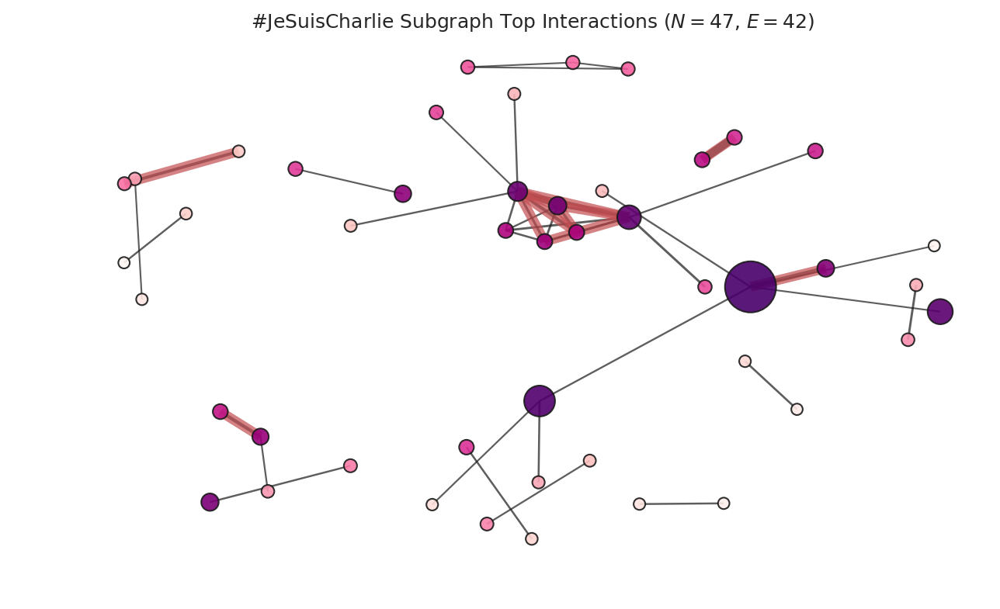

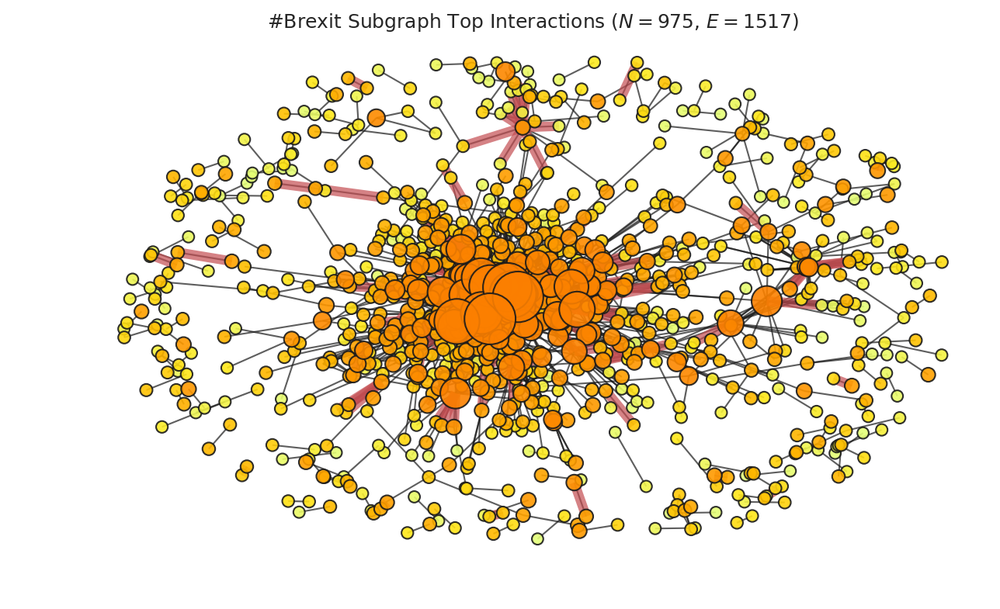

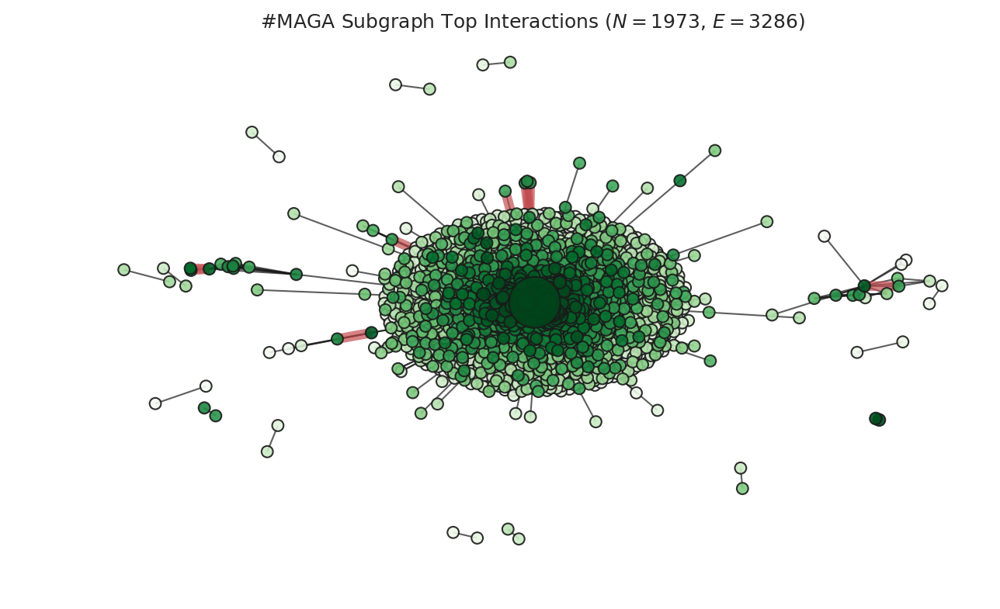

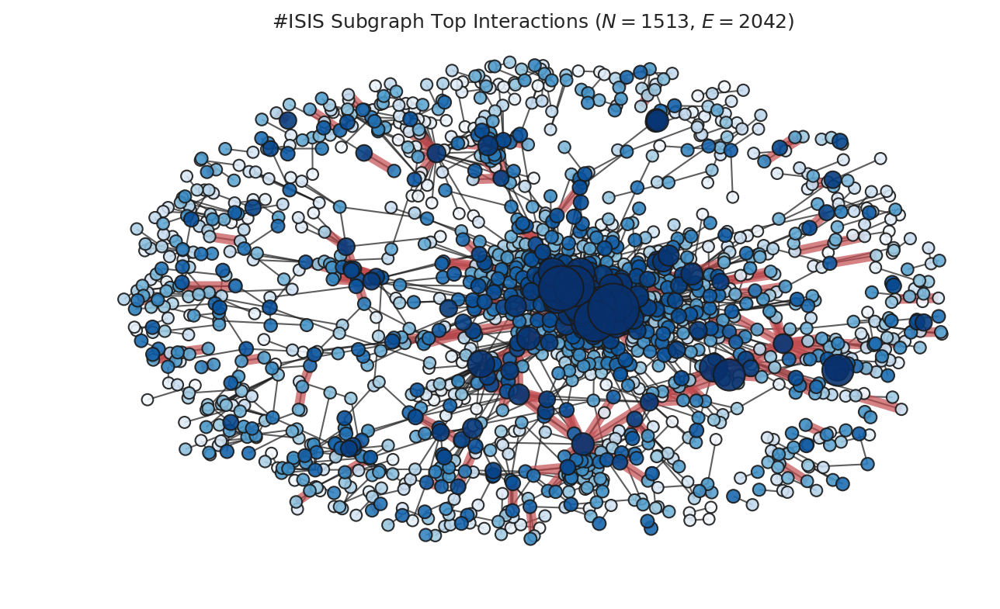

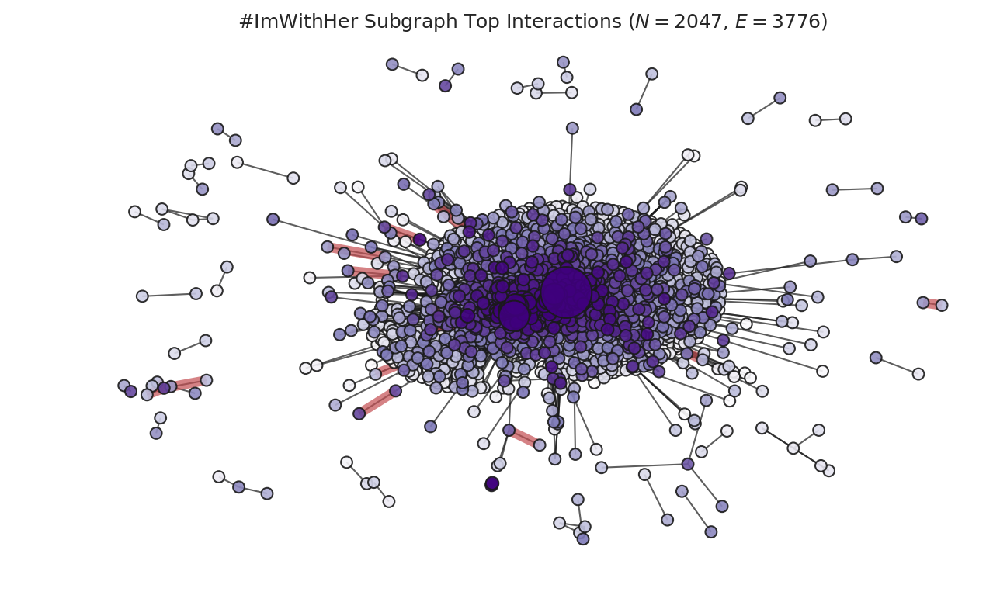

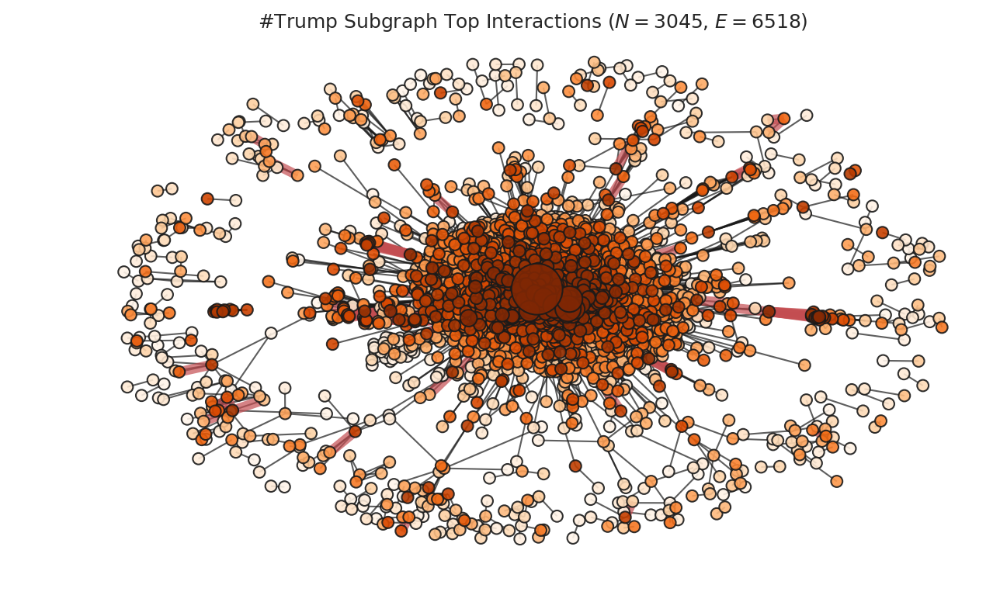

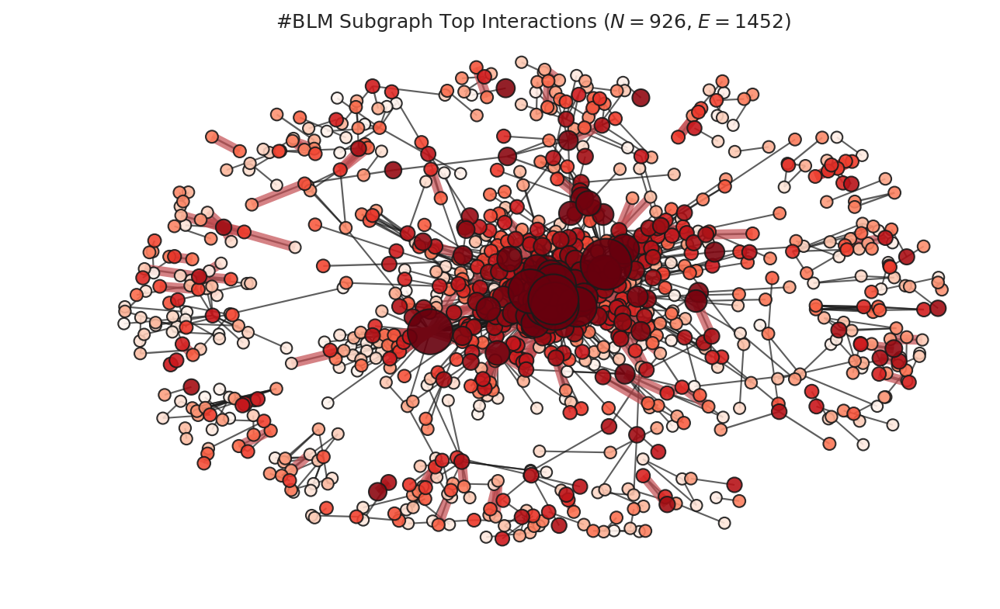

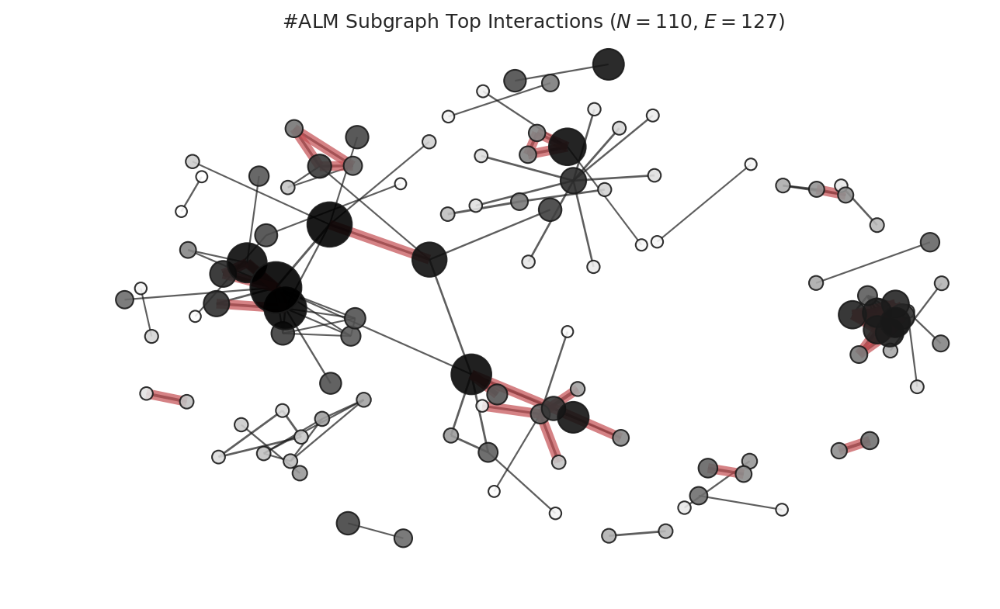

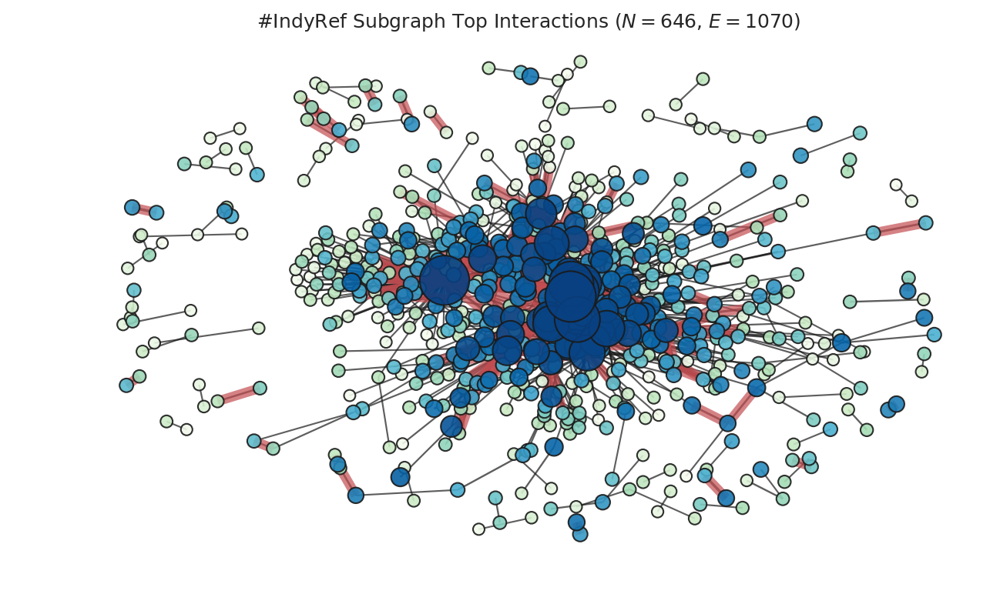

In [81]:
# Draw all subgraphs
for h,h_f in zip(hashtags, hashtags_full):
    draw_graph(h, h_f, hashtag_graph_df_dict, hashtag_cmap_dict)

## 2. Community detection

In [24]:
def compose_graphs(edges_dfs):
    graphs = [create_networkx_graph(x) for x in edges_dfs]
    F = nx.compose_all(graphs)
    return F

In [69]:
def draw_graph_communities(G, hashtag, hashtag_full, nodes_df, edges_df, skip_save):    
    # Get giant component and partition the communities
    giant = max(nx.connected_component_subgraphs(G), key=len)
    partition = community.best_partition(giant)
    top = 10 if len(set(partition.values()))>=10 else len(set(partition.values()))
    top_partitions_sizes = sorted(Counter(partition.values()).items(), reverse=True, key=operator.itemgetter(1))[:10]
    top_partitions = set(map(lambda x: x[0], top_partitions_sizes))
    print("Top %d Graph partitions have sizes: " %top)
    print(map(lambda x: x[1], top_partitions_sizes))

    # Set figure properties
    fig, ax = plt.subplots(1,1)
    fig.set_size_inches(14,10)
    fig.set_dpi(100)
    ax.axis('off')
    fig.set_tight_layout(False)
    ax.set_title(r"#%s Subgraph Top Interactions by Communities ($N_{MaxCC}=%d$)" %(hashtag_full, len(giant.nodes())), fontsize=14)

    # Compute nodes attr (size)
    nodes_attr = {}
    for _,r in nodes_df.iterrows():
        nodes_attr[r["User"]] = r["Count"]
    nodes_attr = {k:nodes_attr[k] for k in nodes_attr if giant.has_node(k)}

    # Calculate parameters for communities drawing
    angle = (2.0 * np.pi) / len(set(partition.values()))
    scale = 2.5
    nums = np.arange( 0.0 , 2.0 * np.pi , angle )
    offsets = np.asarray([(scale * np.cos(a) , scale * np.sin(a)) for a in nums])

    layout_k = 3 / (np.sqrt( len(giant.nodes()) ))
    allpos = dict()
    xm = xMM =ym =yMM = 0
    cmap = plt.cm.get_cmap("hsv")
    # Shuffle partitions
    partitions_set = list(set(partition.values()))
    shuffle(partitions_set)
    community_hubs_pos = {}
    for j, com in enumerate(partitions_set):
        list_nodes = [nodes for nodes in partition.keys()
                                    if partition[nodes] == com]

        nodes_size = [nodes_attr[n] if n in nodes_attr else 50 for n in list_nodes]
        nodes_size = [(300-50)*(x-min(nodes_size))*1.0/(max(nodes_size)-min(nodes_size))+50 for x in nodes_size]

        pos = nx.spring_layout(giant.subgraph(list_nodes),k=layout_k)

        for k in list_nodes:
            pos[k] = [
                pos[k][0] + offsets[j][0],
                pos[k][1] + offsets[j][1] ]
            xm  = min(xm , pos[k][0])
            xMM = max(xMM, pos[k][0])
            ym  = min(ym , pos[k][1])
            yMM = max(yMM, pos[k][1])
        
        # Find community hub only for top 10 partitions (to draw label on it)
        if com in top_partitions:
            hub = max(zip(list_nodes, nodes_size), key=operator.itemgetter(1))[0]
            community_hubs_pos[hub] = pos[hub]

        nx.draw_networkx_nodes(list_nodes, pos, nodelist=list_nodes, node_size=nodes_size,
                               node_color=cmap(1.*j/len(set(partition.values()))), ax=ax,
                               with_labels=False, linewidths=1, edgecolors="k", alpha=0.8)
        allpos.update(pos)

    nx.draw_networkx_edges(giant, allpos, ax=ax, alpha=0.5)
    
    # Build dict of edge attrs (edge weight == frequency of interaction)
    edges_attr = {}
    for _,r in edges_df.iterrows():
        edges_attr[(r["Source"],r["Target"])] = r["Count"]
    avg_edge_weight = edges_df["Count"].describe()["mean"]
    important_edges = [e for e in edges_attr.keys() if edges_attr[e] >= avg_edge_weight and giant.has_edge(e[0], e[1])]
    nx.draw_networkx_edges(giant, pos=allpos, ax=ax, edgelist=important_edges, alpha=0.3, edge_color="darkred", width=4)

    # Get position of labels, not to be in the center of the nodes but a bit above them
    nx.draw_networkx_labels(giant, community_hubs_pos, ax=ax, labels={k:k for k in community_hubs_pos},
                            font_size=12, font_weight="bold", bbox=dict(boxstyle='round,pad=0.2', fc='yellow', ec="orange", alpha=0.8))
    
    # Calculate amount of important edges established between nodes in same/different communities
    tot_edges = giant.number_of_edges()
    same_community = 0
    across_communities = 0
    for e in important_edges:
        p1 = partition[e[0]]
        p2 = partition[e[1]]
        if p1 == p2: # Same community
            same_community+=1
        else:
            across_communities+=1
    print("Consistent interactions within same communities: %.2f%% of %d total edges" %(get_relative_percentage(same_community, tot_edges), tot_edges))
    print("Consistent interactions across different communities: %.2f%% of %d total edges" %(get_relative_percentage(across_communities, tot_edges), tot_edges))
    
    if not hashtag in skip_save:
        plt.savefig(os.path.join(pictures_path,hashtag+"_communities.png"))
    plt.show()

Top 2 Graph partitions have sizes: 
[6, 5]
Consistent interactions within same communities: 21.05% of 19 total edges
Consistent interactions across different communities: 15.79% of 19 total edges


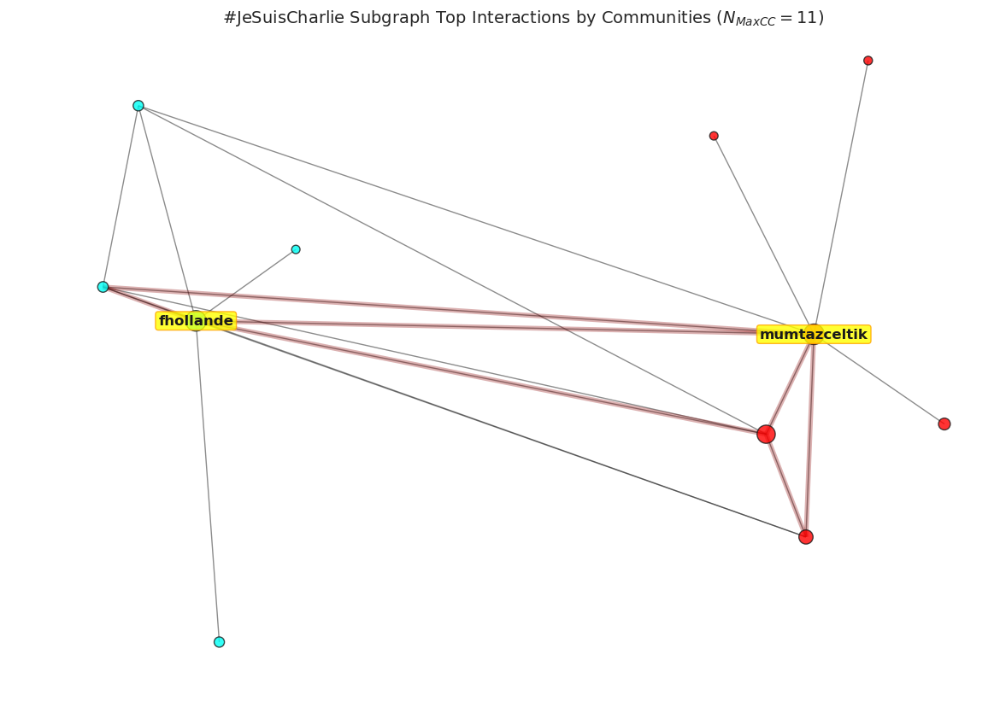

Top 10 Graph partitions have sizes: 
[110, 92, 67, 47, 42, 41, 40, 33, 33, 29]
Consistent interactions within same communities: 15.31% of 1319 total edges
Consistent interactions across different communities: 5.99% of 1319 total edges


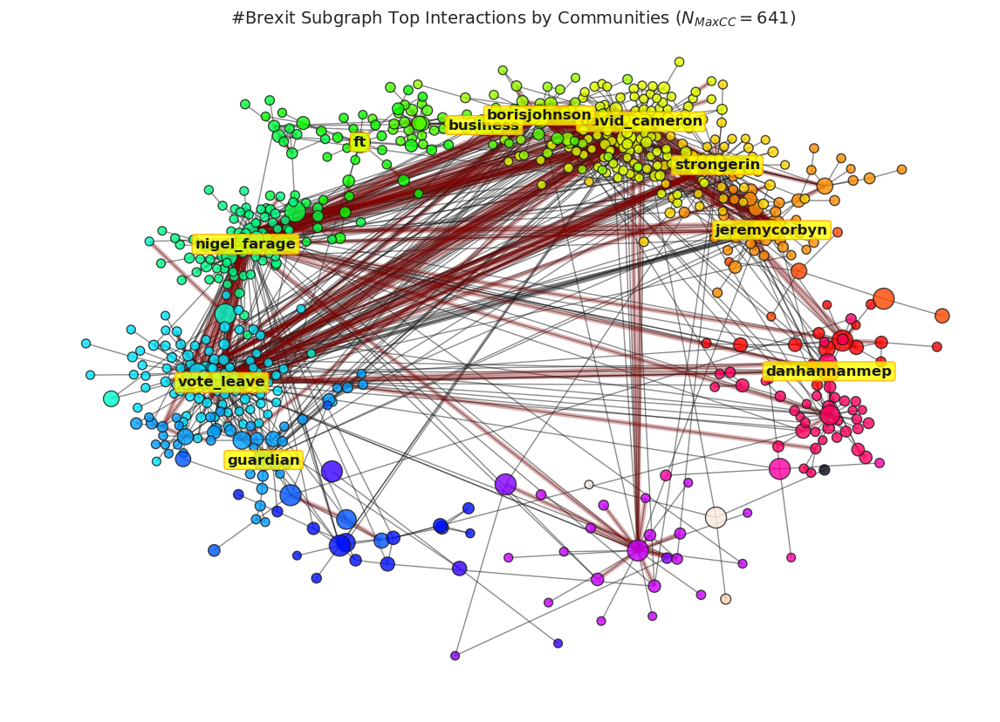

Top 10 Graph partitions have sizes: 
[1510, 99, 65, 48, 35, 31, 29, 18, 10, 10]
Consistent interactions within same communities: 12.82% of 3246 total edges
Consistent interactions across different communities: 6.84% of 3246 total edges


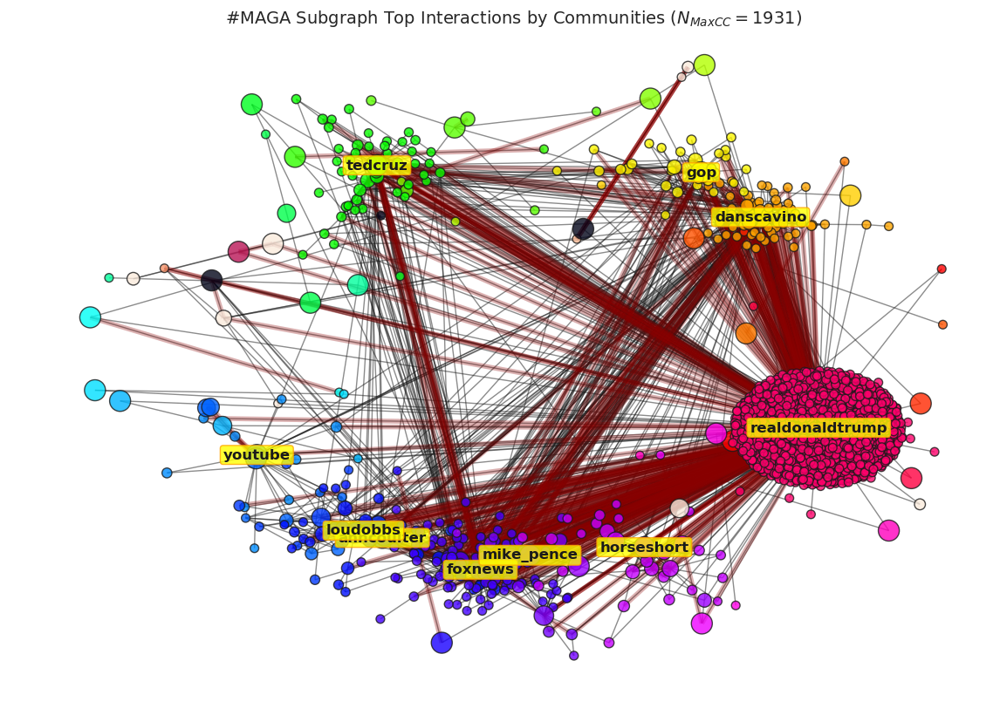

Top 10 Graph partitions have sizes: 
[173, 145, 78, 56, 48, 34, 34, 29, 27, 25]
Consistent interactions within same communities: 20.25% of 1575 total edges
Consistent interactions across different communities: 4.32% of 1575 total edges


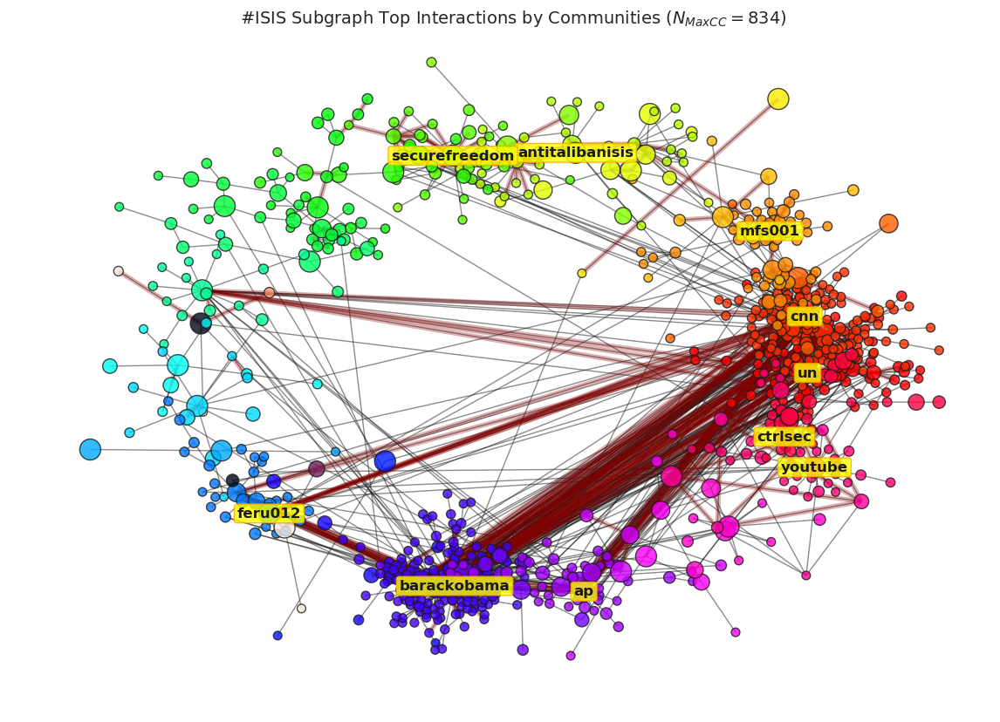

Top 10 Graph partitions have sizes: 
[1258, 331, 136, 30, 21, 15, 14, 8, 8, 7]
Consistent interactions within same communities: 17.39% of 3727 total edges
Consistent interactions across different communities: 4.51% of 3727 total edges


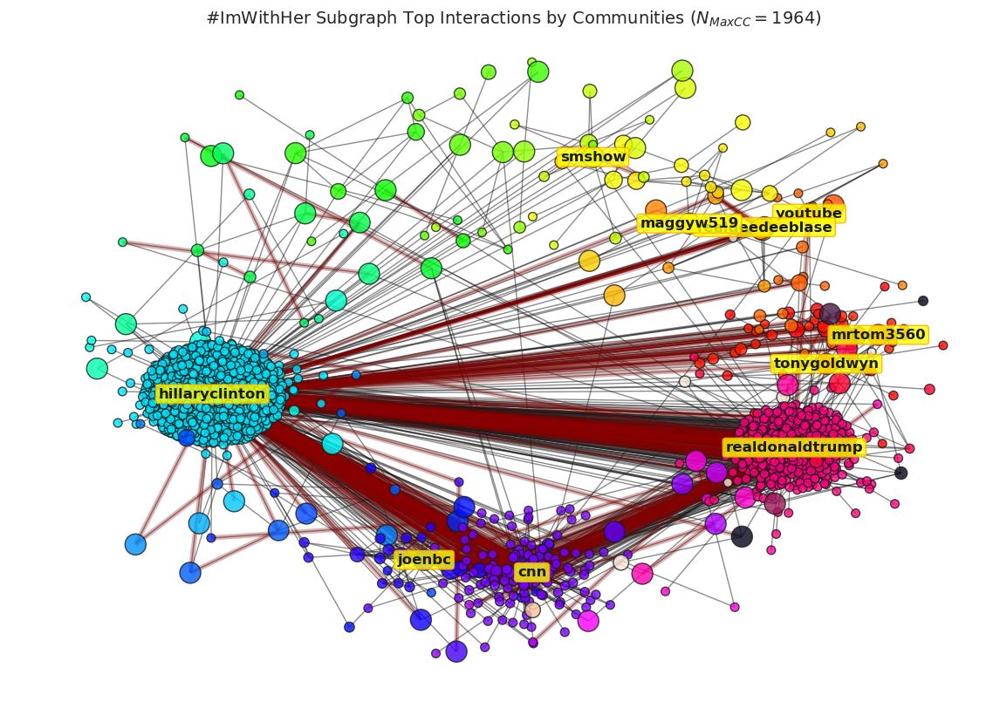

Top 10 Graph partitions have sizes: 
[1348, 329, 130, 119, 85, 85, 65, 42, 40, 27]
Consistent interactions within same communities: 14.90% of 6189 total edges
Consistent interactions across different communities: 5.62% of 6189 total edges


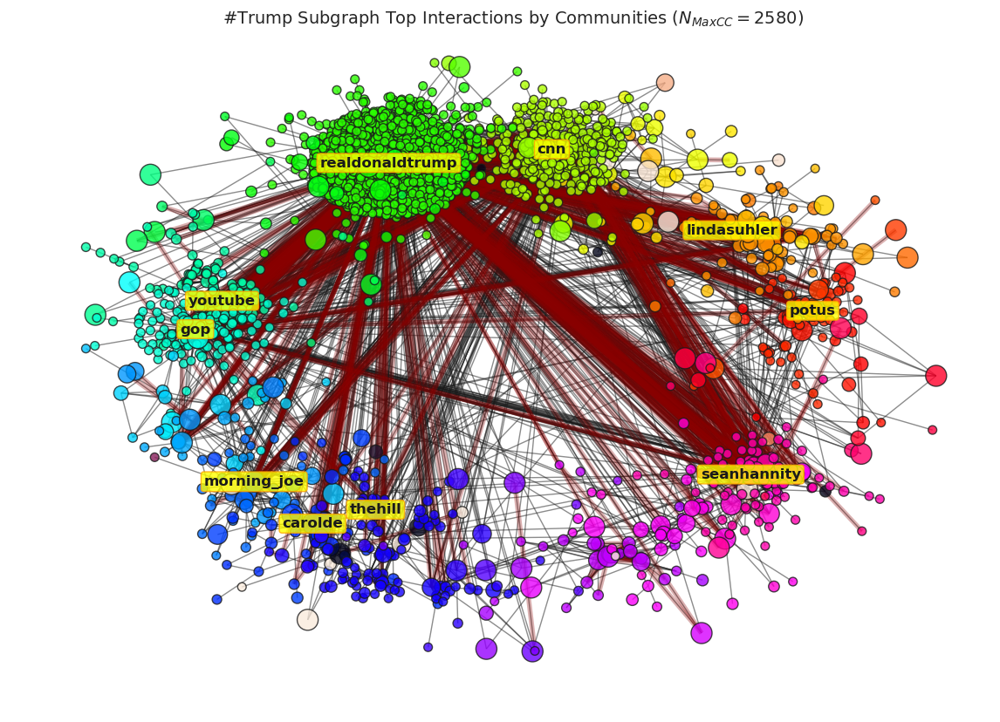

Top 10 Graph partitions have sizes: 
[77, 74, 62, 62, 60, 38, 37, 17, 15, 12]
Consistent interactions within same communities: 21.31% of 1126 total edges
Consistent interactions across different communities: 5.86% of 1126 total edges


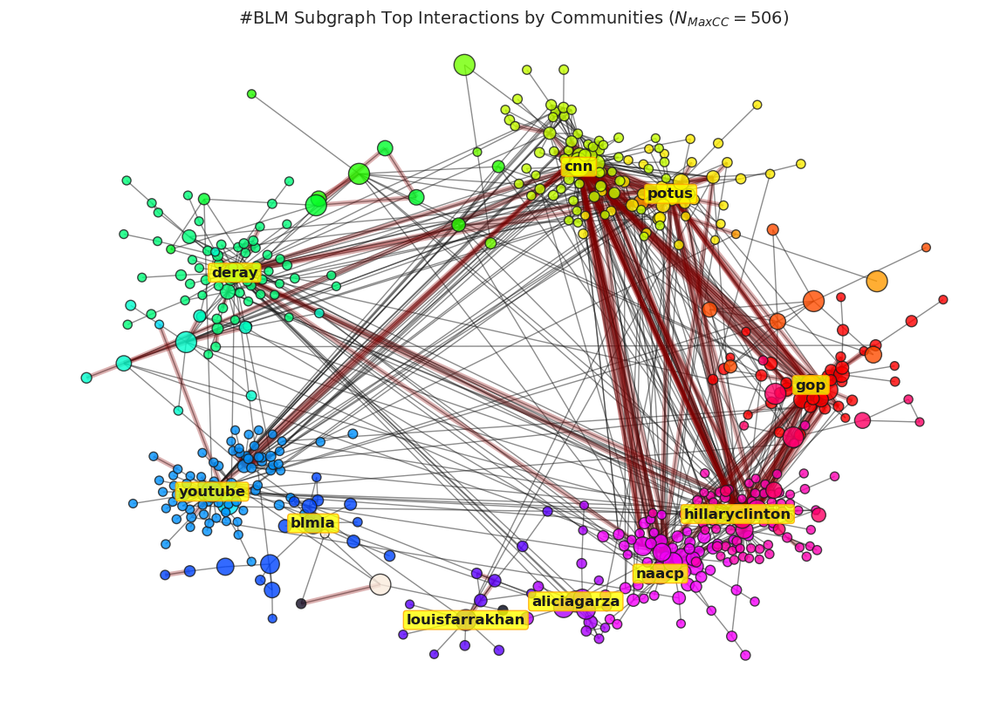

Top 5 Graph partitions have sizes: 
[8, 6, 6, 6, 4]
Consistent interactions within same communities: 24.44% of 45 total edges
Consistent interactions across different communities: 2.22% of 45 total edges


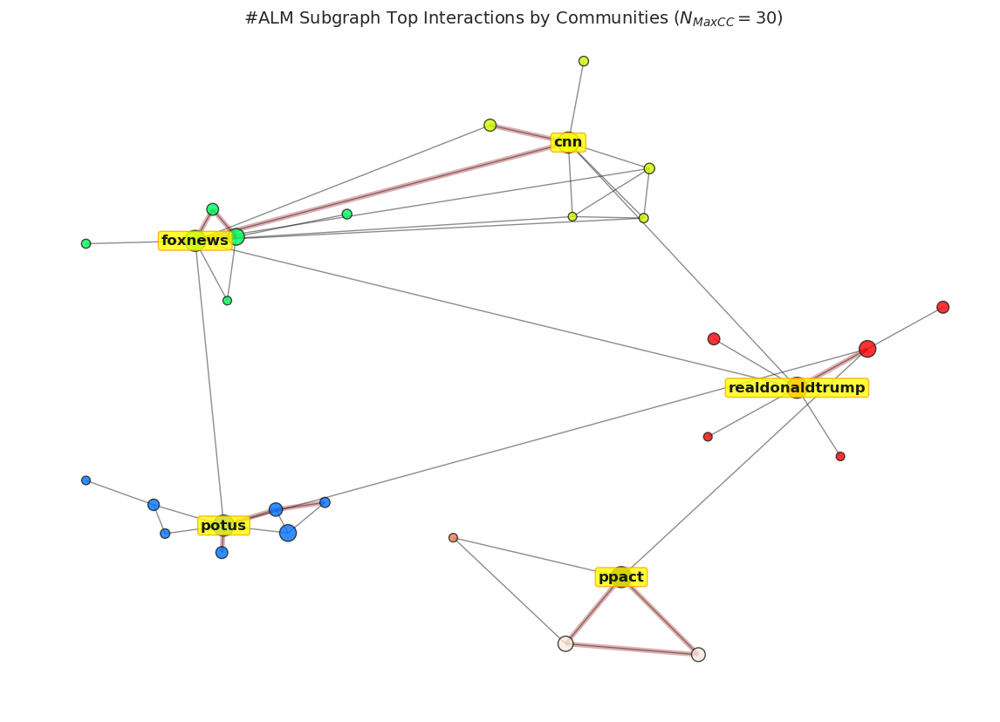

Top 10 Graph partitions have sizes: 
[114, 90, 55, 43, 42, 38, 35, 25, 23, 13]
Consistent interactions within same communities: 19.06% of 997 total edges
Consistent interactions across different communities: 5.52% of 997 total edges


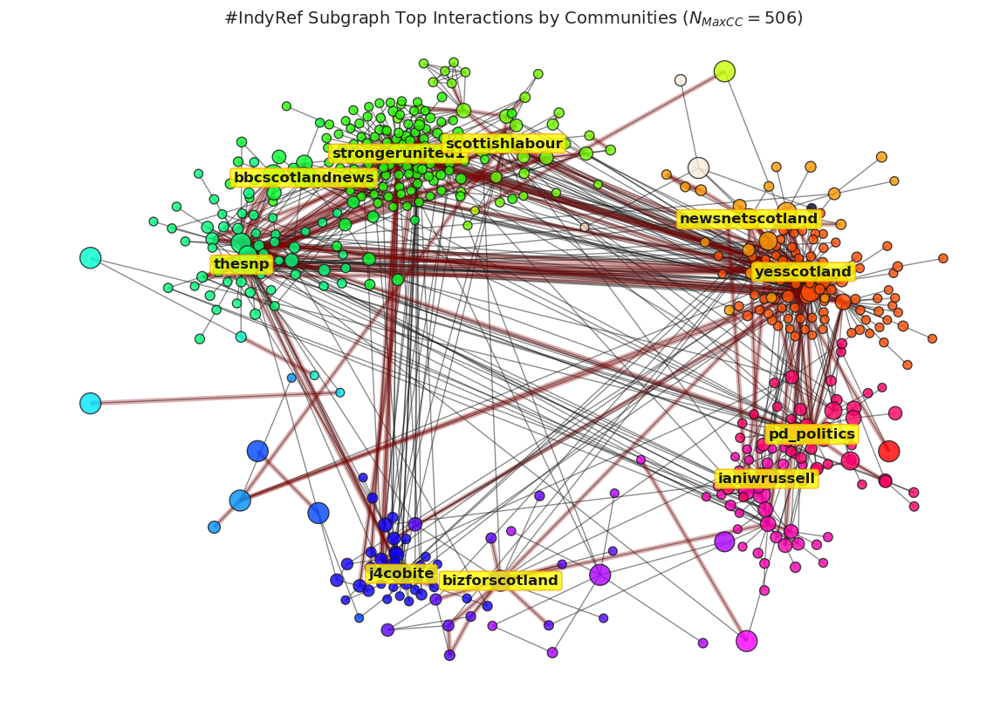

In [73]:
skip_save = {"jesuischarlie", "makeamericagreatagain", "isis", "imwithher", "alllivesmatter", "indyref", "blacklivesmatter", "trump"}
for h,H in zip(hashtags, hashtags_full):
    G = create_networkx_graph(hashtag_graph_df_dict[h]["Edges"])
    draw_graph_communities(G, h, H, hashtag_graph_df_dict[h]["Nodes"], hashtag_graph_df_dict[h]["Edges"], skip_save=skip_save)

Top 10 Graph partitions have sizes: 
[1818, 1428, 177, 26, 21, 16, 16, 14, 12, 10]
Consistent interactions within same communities: 16.65% of 6674 total edges
Consistent interactions across different communities: 3.03% of 6674 total edges


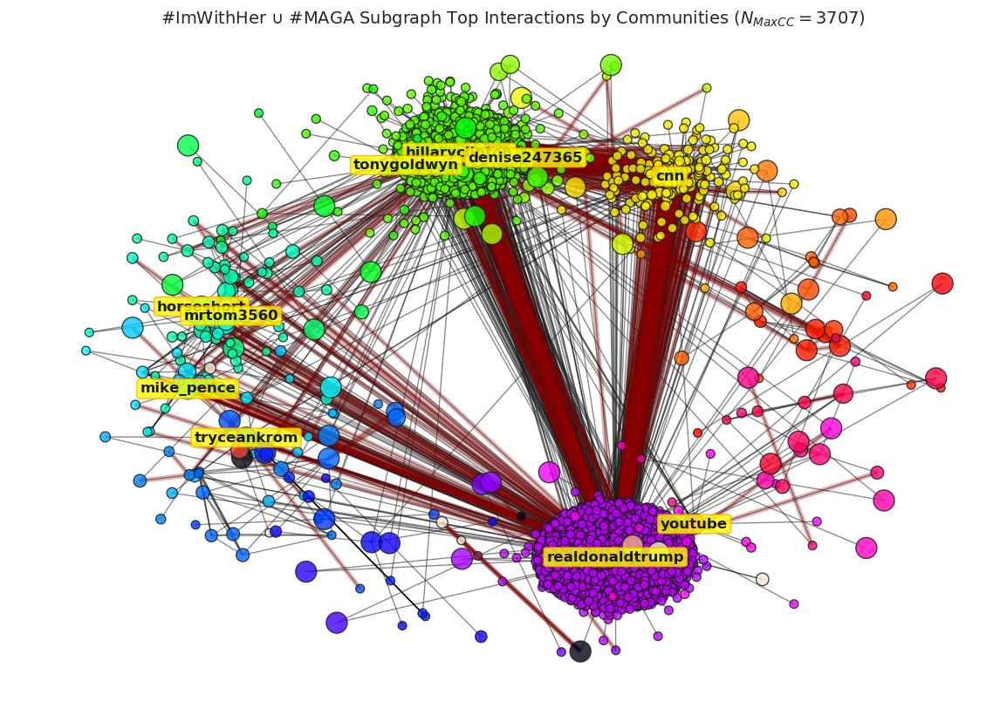

In [65]:
F = compose_graphs([hashtag_graph_df_dict["imwithher"]["Edges"], hashtag_graph_df_dict["makeamericagreatagain"]["Edges"]])
draw_graph_communities(F,
                       "imwithher_maga",
                       r"ImWithHer $\cup$ #MAGA",
                       pd.concat([hashtag_graph_df_dict["imwithher"]["Nodes"], hashtag_graph_df_dict["makeamericagreatagain"]["Nodes"]]).drop_duplicates(),
                       pd.concat([hashtag_graph_df_dict["imwithher"]["Edges"], hashtag_graph_df_dict["makeamericagreatagain"]["Edges"]]).drop_duplicates(),
                       skip_save={})

Top 10 Graph partitions have sizes: 
[2071, 393, 245, 215, 138, 122, 111, 70, 52, 36]
Consistent interactions within same communities: 12.98% of 7971 total edges
Consistent interactions across different communities: 4.88% of 7971 total edges


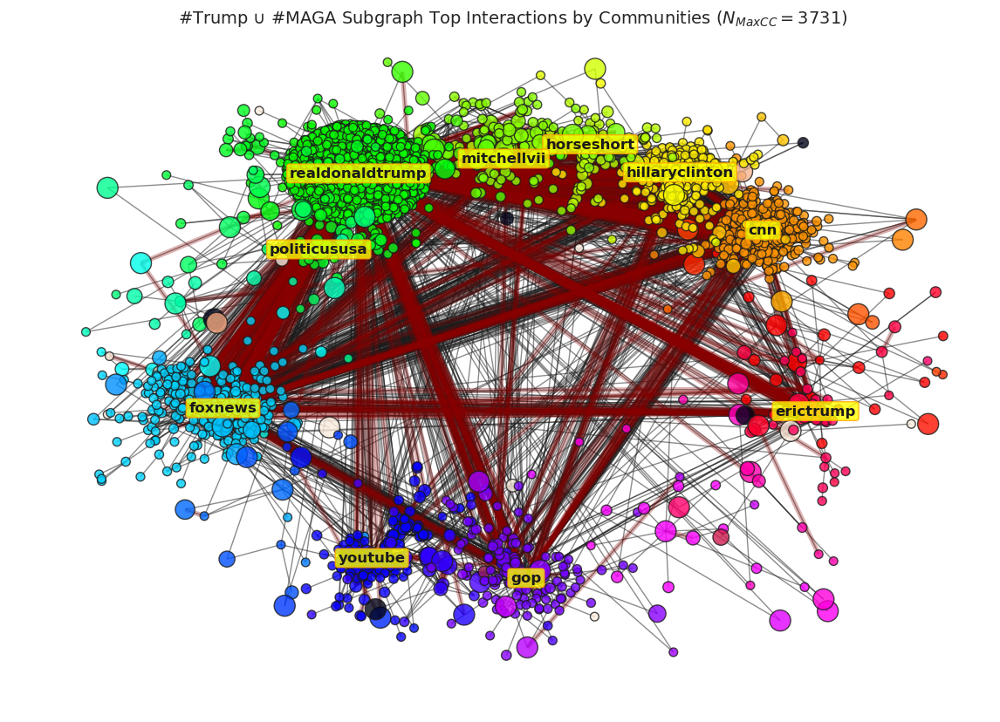

In [66]:
F = compose_graphs([hashtag_graph_df_dict["trump"]["Edges"], hashtag_graph_df_dict["makeamericagreatagain"]["Edges"]])
draw_graph_communities(F,
                       "trump_maga",
                       r"Trump $\cup$ #MAGA",
                       pd.concat([hashtag_graph_df_dict["trump"]["Nodes"], hashtag_graph_df_dict["makeamericagreatagain"]["Nodes"]]).drop_duplicates(),
                       pd.concat([hashtag_graph_df_dict["trump"]["Edges"], hashtag_graph_df_dict["makeamericagreatagain"]["Edges"]]).drop_duplicates(),
                       skip_save={})

Top 10 Graph partitions have sizes: 
[1420, 1402, 403, 266, 120, 101, 86, 63, 38, 30]
Consistent interactions within same communities: 15.19% of 9139 total edges
Consistent interactions across different communities: 4.30% of 9139 total edges


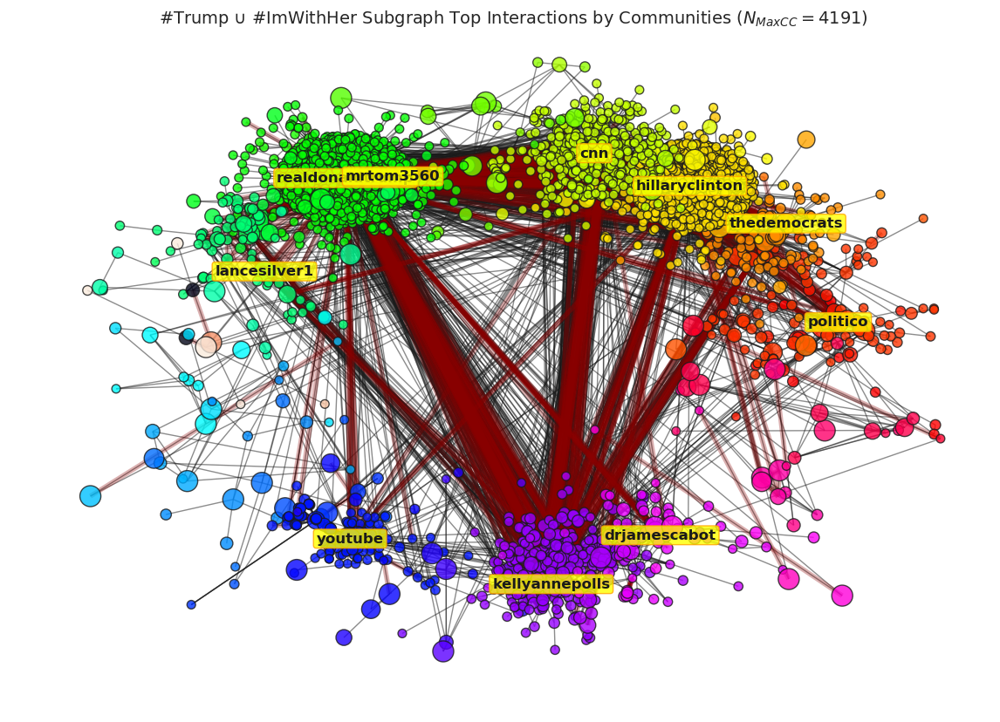

In [67]:
F = compose_graphs([hashtag_graph_df_dict["trump"]["Edges"], hashtag_graph_df_dict["imwithher"]["Edges"]])
draw_graph_communities(F,
                       "trump_imwithher",
                       r"Trump $\cup$ #ImWithHer",
                       pd.concat([hashtag_graph_df_dict["trump"]["Nodes"], hashtag_graph_df_dict["imwithher"]["Nodes"]]).drop_duplicates(),
                       pd.concat([hashtag_graph_df_dict["trump"]["Edges"], hashtag_graph_df_dict["imwithher"]["Edges"]]).drop_duplicates(),
                       skip_save={})

Top 10 Graph partitions have sizes: 
[2397, 1506, 510, 163, 132, 82, 55, 46, 40, 29]
Consistent interactions within same communities: 15.02% of 10910 total edges
Consistent interactions across different communities: 3.35% of 10910 total edges


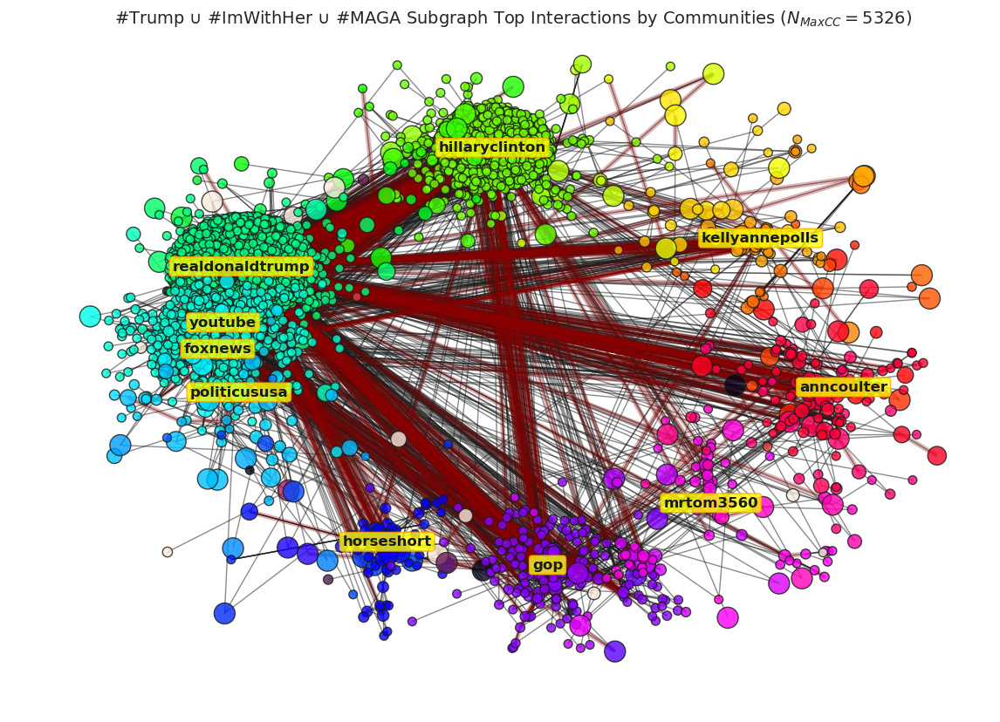

In [68]:
F = compose_graphs([hashtag_graph_df_dict["trump"]["Edges"], hashtag_graph_df_dict["imwithher"]["Edges"], hashtag_graph_df_dict["makeamericagreatagain"]["Edges"]])
draw_graph_communities(F,
                       "trump_imwithher_maga",
                       r"Trump $\cup$ #ImWithHer $\cup$ #MAGA",
                       pd.concat([hashtag_graph_df_dict["trump"]["Nodes"], hashtag_graph_df_dict["imwithher"]["Nodes"], hashtag_graph_df_dict["makeamericagreatagain"]["Nodes"]]).drop_duplicates(),
                       pd.concat([hashtag_graph_df_dict["trump"]["Edges"], hashtag_graph_df_dict["imwithher"]["Edges"], hashtag_graph_df_dict["makeamericagreatagain"]["Edges"]]).drop_duplicates(),
                       skip_save={})

## 3. Calculating network modularity with SNAP.Py
Modularity is one measure of the structure of networks or graphs. It was designed to measure the strength of division of a network into modules (also called groups, clusters or communities). Networks with high modularity have dense connections between the nodes within modules but sparse connections between nodes in different modules. Modularity is often used in optimization methods for detecting community structure in networks.

Modularity is the fraction of the edges that fall within the given groups minus the expected fraction if edges were distributed at random. The value of the modularity lies in the range $[-1,1]$. It is positive if the number of edges within groups exceeds the number expected on the basis of chance. For a given division of the network's vertices into some modules, modularity reflects the concentration of edges within modules compared with random distribution of links between all nodes regardless of modules.

In [12]:
def get_modularity(giant, method="Clauset-Newman-Moore"):
    CmtyV = snap.TCnComV()
    modularity = snap.CommunityCNM(giant, CmtyV) if method == "Clauset-Newman-Moore" else snap.CommunityGirvanNewman(giant, CmtyV)
    return modularity, CmtyV

def calculate_modularity(hashtag_graph_df_dict, hashtag, hashtag_full):
    print("Calculating modularity for top interactions subgraph (%s)" %hashtag_full)
    sys.stdout.flush()
    # Encode usernames
    all_usernames = set()
    for df_type,col in [("Nodes","User"), ("Edges", "Source"), ("Edges","Target")]:
        all_usernames.update(hashtag_graph_df_dict[hashtag][df_type][col])
    user_encoding_dict = dict(zip(list(all_usernames), range(0,len(all_usernames))))
    
    # Create undir graph
    UGraph = TUNGraph.New()

    # Add nodes to graph
    for v in user_encoding_dict.values():
        UGraph.AddNode(v)

    # Add edges to graph
    for _,r in hashtag_graph_df_dict[hashtag]["Edges"].iterrows():
        src_enc = user_encoding_dict[r["Source"]]
        trg_enc = user_encoding_dict[r["Target"]]
        UGraph.AddEdge(src_enc, trg_enc)

    # Get giant component
    giant = snap.GetMxScc(UGraph)
    
    for method in ["Clauset-Newman-Moore", "GirvanNewman"]:
        print("Modularity with method "+method)
        modularity, CmtyV = get_modularity(giant, method)
        top = 10 if CmtyV.Len()>=10 else CmtyV.Len()
        print("Top %d Graph partitions have sizes: " %top)
        communities_sorted = sorted([Cmty.Len() for Cmty in CmtyV], reverse=True)
        print(communities_sorted[:top])
        print("The modularity of the network is %f" % modularity)

In [13]:
for h,H in zip(hashtags, hashtags_full):
    calculate_modularity(hashtag_graph_df_dict, h, H)

Calculating modularity for top interactions subgraph (JeSuisCharlie)
Modularity with method Clauset-Newman-Moore
Top 3 Graph partitions have sizes: 
[4, 4, 3]
The modularity of the network is 0.162050
Modularity with method GirvanNewman
Top 2 Graph partitions have sizes: 
[10, 1]
The modularity of the network is -0.054017
Calculating modularity for top interactions subgraph (Brexit)
Modularity with method Clauset-Newman-Moore
Top 10 Graph partitions have sizes: 
[146, 78, 69, 66, 43, 33, 29, 28, 26, 25]
The modularity of the network is 0.555059
Modularity with method GirvanNewman
Top 10 Graph partitions have sizes: 
[83, 64, 54, 50, 40, 33, 32, 29, 29, 28]
The modularity of the network is 0.559583
Calculating modularity for top interactions subgraph (MAGA)
Modularity with method Clauset-Newman-Moore
Top 10 Graph partitions have sizes: 
[1375, 393, 31, 12, 10, 6, 6, 5, 4, 4]
The modularity of the network is 0.412671
Modularity with method GirvanNewman
Top 10 Graph partitions have sizes:

Hereby are summarized the modularity results:

| Hashtag | Modularity (CNM) | Modularity (GN)
|---|---|---|
| #JeSuisCharlie | 0.162050 | -0.054017
| #Brexit | 0.555059 | 0.559583
| #MakeAmericaGreatAgain | 0.412671 | 0.396844
| #ISIS | 0.649168 | 0.638591
| #ImWithher | 0.476937 | 0.491165
| #Trump | 0.529811 | 0.513545
| #BlackLivesMatter | 0.584629 | 0.587441
| #AllLivesMatter | 0.564691 | 0.568148
| #IndyRef | 0.584632 | 0.580205